In [1]:
# Importing necessary packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import sklearn.metrics as metrics
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.datasets import make_regression

import os
import warnings
warnings.filterwarnings('ignore')  # ignore notifications

/home/rana/anaconda3/lib/python3.9/site-packages/dask/config.py:131: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/home/rana/anaconda3/lib/python3.9/site-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [2]:
# The following function is for counting missing values

def missing_values(d):
    missing = pd.concat([d.isnull().sum(), 100 * d.isnull().mean()], axis=1)
    missing.columns=['count', '%']
    return missing.sort_values(by=['count'])

# The following function is for counting unique values

def unique_values(d):
    dict = {}
    for i in list(d.columns):
        dict[i] = d[i].value_counts().shape[0]
    return pd.DataFrame(dict,index=["unique count"]).transpose()

In [3]:
df = pd.read_csv("housing.csv")
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


**Features:**
- longitude: A measure of how far west a house is; a higher value is farther west
- latitude: A measure of how far north a house is; a higher value is farther north
- housing_median_age: Median age of a house within a block; a lower number is a newer building
- total_rooms: Total number of rooms within a block
- total_bedrooms: Total number of bedrooms within a block
- population: Total number of people residing within a block
- households: Total number of households, a group of people residing within a home unit, for a block
- median_income: Median income for households within a block of houses (measured in tens of thousands of US Dollars)
- ocean_proximity: Location of the house w.r.t ocean/sea

**Target variable:**
- median_house_value: Median house value for households within a block (measured in US Dollars)

In [4]:
df.shape

(20640, 10)

In [5]:
df.duplicated().sum()

0

#### Comment: There are no duplicated items.

In [6]:
missing_values(df)

,count,%
longitude,0,0.000000
latitude,0,0.000000
housing_median_age,0,0.000000
total_rooms,0,0.000000
population,0,0.000000
households,0,0.000000
median_income,0,0.000000
median_house_value,0,0.000000
ocean_proximity,0,0.000000
total_bedrooms,207,1.002907


#### Comment: There are 207  missing values in 'total_bedrooms' column. Only one column has missing values.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


**Comments:**
- There are only one categorical feature namely 'ocean_proximity'

In [8]:
unique_values(df)

,unique count
longitude,844
latitude,862
housing_median_age,52
total_rooms,5926
total_bedrooms,1923
population,3888
households,1815
median_income,12928
median_house_value,3842
ocean_proximity,5


#### Comment: 'Ocean_proximity' column is object type column with 5 unique values. One-Hot Encoding will be one way to deal with this column.

In [9]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
longitude,20640.0,NaN,NaN,NaN,-119.569704,2.003532,-124.35,-121.8,-118.49,-118.01,-114.31
latitude,20640.0,NaN,NaN,NaN,35.631861,2.135952,32.54,33.93,34.26,37.71,41.95
housing_median_age,20640.0,NaN,NaN,NaN,28.639486,12.585558,1.0,18.0,29.0,37.0,52.0
total_rooms,20640.0,NaN,NaN,NaN,2635.763081,2181.615252,2.0,1447.75,2127.0,3148.0,39320.0
total_bedrooms,20433.0,NaN,NaN,NaN,537.870553,421.38507,1.0,296.0,435.0,647.0,6445.0
population,20640.0,NaN,NaN,NaN,1425.476744,1132.462122,3.0,787.0,1166.0,1725.0,35682.0
households,20640.0,NaN,NaN,NaN,499.53968,382.329753,1.0,280.0,409.0,605.0,6082.0
median_income,20640.0,NaN,NaN,NaN,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,NaN,NaN,NaN,206855.816909,115395.615874,14999.0,119600.0,179700.0,264725.0,500001.0
ocean_proximity,20640,5,<1H OCEAN,9136,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [11]:
feature_names = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income', 'ocean_proximity']
target = ['median_house_value']

In [12]:
fig = make_subplots(rows=3, cols=3, subplot_titles=('<i>longitude', '<i>latitude',
'<i>housing_median_age', '<i>total_rooms', '<i>total_bedrooms', '<i>population', '<i>households', '<i>median_income', '<i>median_house_value'))
            
fig.add_trace(go.Histogram(x=df['longitude'], name='longitude'), row=1, col=1)
fig.add_trace(go.Histogram(x=df['latitude'], name='latitude'), row=1, col=2)
fig.add_trace(go.Histogram(x=df['housing_median_age'], name='housing_median_age'), row=1, col=3)
fig.add_trace(go.Histogram(x=df['total_rooms'], name='total_rooms'), row=2, col=1)
fig.add_trace(go.Histogram(x=df['total_bedrooms'], name='total_bedrooms'), row=2, col=2)
fig.add_trace(go.Histogram(x=df['population'], name='population'), row=2, col=3)
fig.add_trace(go.Histogram(x=df['households'], name='households'), row=3, col=1)
fig.add_trace(go.Histogram(x=df['median_income'], name='median_income'), row=3, col=2)
fig.add_trace(go.Histogram(x=df['median_house_value'], name='median_house_value'), row=3,col=3)
fig.update_layout(template='plotly_dark', title_text='<b>Distributions', title_x=0.5)

**Comments:** There are some outliers that need to be addressed. Also the column 'total_bedrooms' has missing values, we can replace the missing values by mean since the distribution is close to normal.

In [13]:
scl = [ [0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
    [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"] ]
fig = px.box(df, x="ocean_proximity", y="median_house_value", template='plotly_dark', title='<b>Boxplots', color='ocean_proximity')
fig.update_layout(title_x=0.5)
fig.show()

In [14]:
# calculate the IQR for column A
q1 = df['housing_median_age'].quantile(0.25)
q3 = df['housing_median_age'].quantile(0.75)
iqr = q3 - q1

# identify outliers
outliers = df[(df['housing_median_age'] < q1 - 1.5*iqr) | (df['housing_median_age'] > q3 + 1.5*iqr)]

# print the outliers
print(outliers)

Empty DataFrame
Columns: [longitude, latitude, housing_median_age, total_rooms, total_bedrooms, population, households, median_income, median_house_value, ocean_proximity]
Index: []


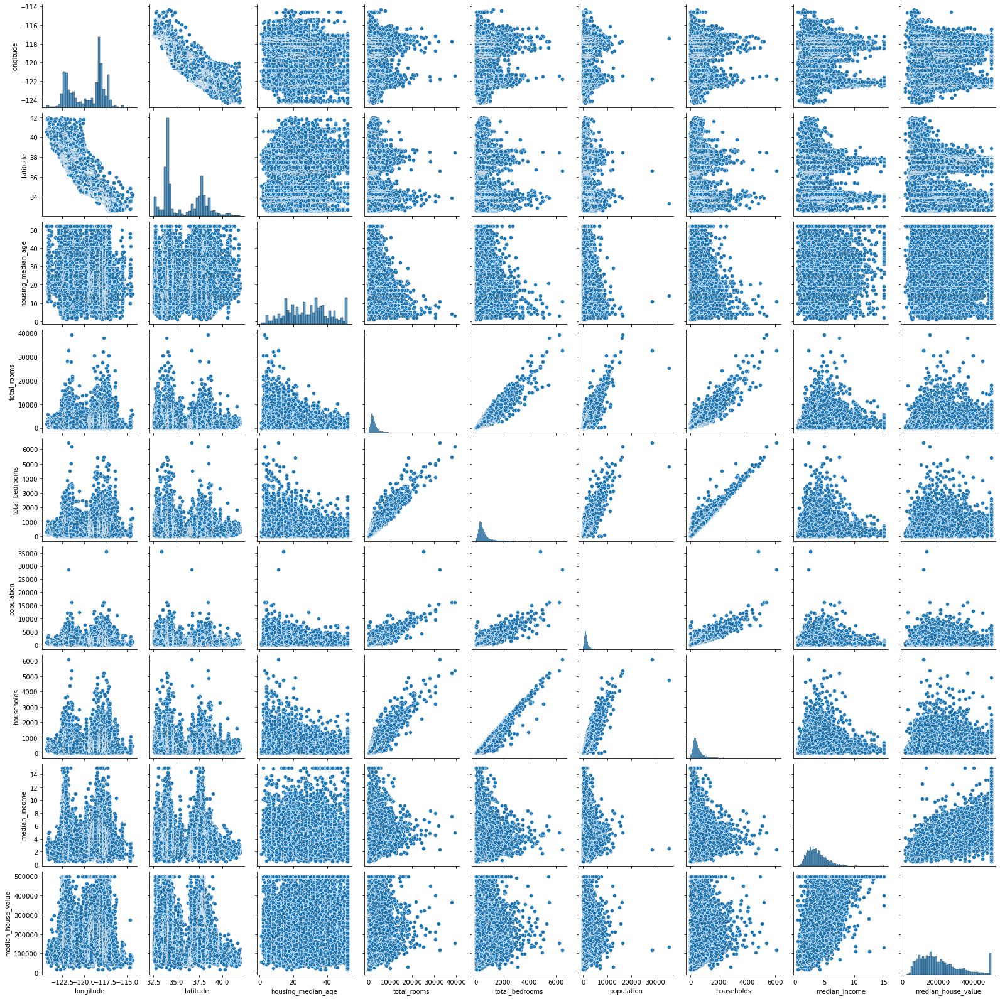

In [15]:
sns.pairplot(data=df)

In [16]:
fig=px.imshow(df.corr(),text_auto=True, template='plotly_dark', color_continuous_scale=px.colors.sequential.Blues, aspect='auto',title='<b>Correlation matrix')
fig.update_layout(title_x=0.5)
fig.show()

**Comments:**
- High correlation (~0.7) between target variable(median_house_value) and median_income
- High correlation between features, this is multicollinearity

In [17]:
fig = px.scatter(df, x="median_income", y="median_house_value", trendline="ols", color_discrete_sequence=['steelbl'],
                template='plotly_dark', title='<b>Target variable dependency on median_income', color='median_house_value', color_continuous_scale=px.colors.sequential.Blues)
fig.update_layout(title_x=0.5)
fig.show()

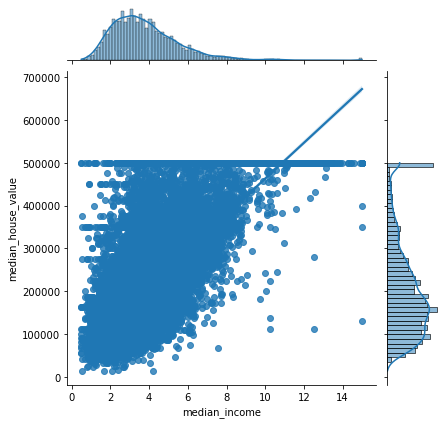

In [18]:
sns.jointplot(x='median_income', y='median_house_value', data=df, kind="reg");

In [19]:
# Filling the missing values by the mean
df['total_bedrooms'].fillna(df['total_bedrooms'].mean(), inplace=True)

In [20]:
missing_values(df)

,count,%
longitude,0,0.0
latitude,0,0.0
housing_median_age,0,0.0
total_rooms,0,0.0
total_bedrooms,0,0.0
population,0,0.0
households,0,0.0
median_income,0,0.0
median_house_value,0,0.0
ocean_proximity,0,0.0


In [21]:
# save the data to a new csv file
df.to_csv('housing_data_clean.csv', index=False)

In [22]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [23]:
df1=pd.read_csv("housing_data_clean.csv")
df1.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
